In [11]:
import numpy as np
import pandas as pd
import os
import math
import glob
import matplotlib.pyplot as plt
import seaborn
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.figure_factory as ff
import warnings 
warnings.filterwarnings('ignore')

In [12]:
district_df = pd.read_csv('districts_info.csv')
product_df = pd.read_csv('products_info.csv')

csvs = glob.glob('/Users/salazar1210/Data Science/Project prop1/engagement_data/*.csv')
dframes = []

for file in csvs:
    df = pd.read_csv(file, index_col=None, header=0)
    district_id = file.split('/')[-1].split('.')[0]
    df['district_id'] = district_id
    dframes.append(df)

engagement_df = pd.concat(dframes)
engagement_df = engagement_df.reset_index(drop=True)

engagement_df[['district_id']] = engagement_df[['district_id']].astype(int)
engagement_df2 = pd.merge(engagement_df, district_df, on = 'district_id')
engagement_complete = pd.merge(engagement_df2, product_df, left_on='lp_id', right_on='LP ID')


pct_black_hispanic = []
for value in engagement_complete['pct_black/hispanic']:
    val = 0
    if isinstance(value, float):
        val = None
    else:
        k = value.split(", ")
        val = k[0][1:]
    pct_black_hispanic.append(val)
pct_free_reduced = []
for value in engagement_complete['pct_free/reduced']:
    val = 0
    if isinstance(value, float):
        val = None
    else:
        k = value.split(", ")
        val = k[0][1:]
    pct_free_reduced.append(val)
pp_total_raw = []
for value in engagement_complete['pp_total_raw']:
    val = 0
    if isinstance(value, float):
        val = None
    else:
        k = value.split(", ")
        val = k[0][1:]
    pp_total_raw.append(val)
        
engagement_complete['pct_black_hispanic'] = pct_black_hispanic
engagement_complete['pct_free_reduced'] = pct_free_reduced
engagement_complete['pp_total_raw'] = pp_total_raw
engagement_complete = engagement_complete.drop(['lp_id','URL','county_connections_ratio','pct_black/hispanic','pct_free/reduced'], axis=1)

engagement_complete['pct_black_hispanic'] = engagement_complete['pct_black_hispanic'].astype(float)
engagement_complete['pct_free_reduced'] = engagement_complete['pct_free_reduced'].astype(float)
engagement_complete['pp_total_raw'] = engagement_complete['pp_total_raw'].astype(float)

In [13]:
engagement_complete

,time,pct_access,engagement_index,district_id,state,locale,pp_total_raw,LP ID,Product Name,Provider/Company Name,Primary Essential Function,pct_black_hispanic,pct_free_reduced
0,2020-01-01,0.04,1.30,3188,NaN,NaN,NaN,29322,Khan Academy,Khan Academy,LC - Digital Learning Platforms,NaN,NaN
1,2020-01-02,0.26,17.78,3188,NaN,NaN,NaN,29322,Khan Academy,Khan Academy,LC - Digital Learning Platforms,NaN,NaN
2,2020-01-03,0.82,121.42,3188,NaN,NaN,NaN,29322,Khan Academy,Khan Academy,LC - Digital Learning Platforms,NaN,NaN
3,2020-01-05,0.00,NaN,3188,NaN,NaN,NaN,29322,Khan Academy,Khan Academy,LC - Digital Learning Platforms,NaN,NaN
4,2020-01-06,2.86,451.43,3188,NaN,NaN,NaN,29322,Khan Academy,Khan Academy,LC - Digital Learning Platforms,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11691582,2020-12-15,0.11,3.80,4629,Illinois,Suburb,16000.0,43149,ContentKeeper,ContentKeeper Technologies,SDO - School Management Software - Mobile Devi...,0.0,0.2
11691583,2020-12-17,0.07,1.38,4629,Illinois,Suburb,16000.0,43149,ContentKeeper,ContentKeeper Technologies,SDO - School Management Software - Mobile Devi...,0.0,0.2
11691584,2020-12-18,0.10,3.28,4629,Illinois,Suburb,16000.0,43149,ContentKeeper,ContentKeeper Technologies,SDO - School Management Software - Mobile Devi...,0.0,0.2
11691585,2020-12-21,0.09,3.28,4629,Illinois,Suburb,16000.0,43149,ContentKeeper,ContentKeeper Technologies,SDO - School Management Software - Mobile Devi...,0.0,0.2


In [14]:
engagement_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11691587 entries, 0 to 11691586
Data columns (total 13 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   time                        object 
 1   pct_access                  float64
 2   engagement_index            float64
 3   district_id                 int64  
 4   state                       object 
 5   locale                      object 
 6   pp_total_raw                float64
 7   LP ID                       int64  
 8   Product Name                object 
 9   Provider/Company Name       object 
 10  Primary Essential Function  object 
 11  pct_black_hispanic          float64
 12  pct_free_reduced            float64
dtypes: float64(5), int64(2), object(6)
memory usage: 1.2+ GB


In [15]:
engagement_complete.describe()

,pct_access,engagement_index,district_id,pp_total_raw,LP ID,pct_black_hispanic,pct_free_reduced
count,1.168087e+07,9.414268e+06,1.169159e+07,6.238946e+06,1.169159e+07,9.139701e+06,7.752268e+06
mean,8.357378e-01,2.573893e+02,5.255355e+03,1.133406e+04,5.476999e+04,1.418011e-01,2.365011e-01
std,4.138046e+00,2.146490e+03,2.642549e+03,4.050854e+03,2.633956e+04,2.248518e-01,2.098539e-01
min,0.000000e+00,1.000000e-02,1.000000e+03,4.000000e+03,1.053300e+04,0.000000e+00,0.000000e+00
25%,1.000000e-02,9.400000e-01,2.956000e+03,8.000000e+03,3.085100e+04,0.000000e+00,0.000000e+00
50%,5.000000e-02,5.080000e+00,5.006000e+03,1.000000e+04,5.482700e+04,0.000000e+00,2.000000e-01
75%,2.200000e-01,3.388000e+01,7.741000e+03,1.400000e+04,7.688900e+04,2.000000e-01,4.000000e-01
max,1.000000e+02,1.527471e+05,9.927000e+03,3.200000e+04,9.991600e+04,8.000000e-01,8.000000e-01


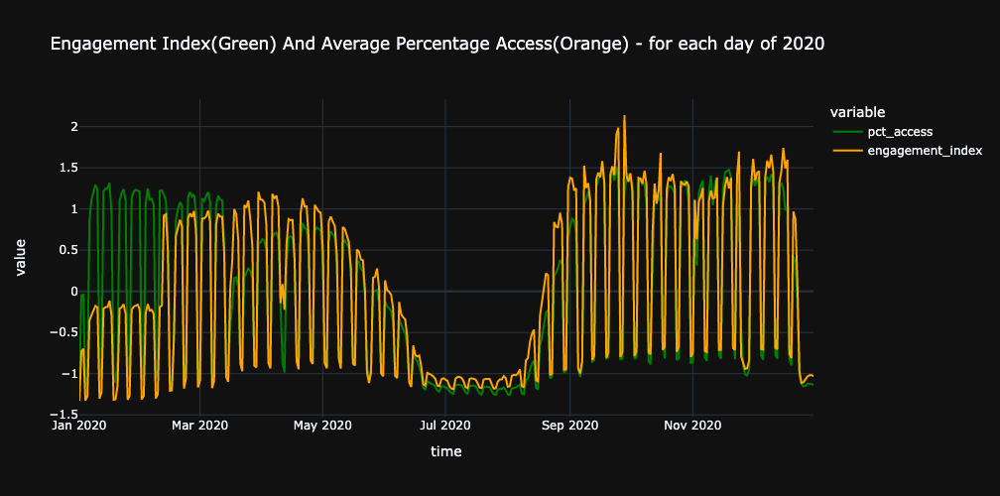

In [16]:
for_timeseries = engagement_complete[['time','pct_access','engagement_index']]
grouped_by_date = for_timeseries.groupby('time', as_index=False).mean()

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
grouped_by_date[['engagement_index','pct_access']] = sc.fit_transform(grouped_by_date[['engagement_index','pct_access']])

fig = px.line(grouped_by_date, x='time', y=['pct_access', 'engagement_index'],height=500,
                title='Engagement Index(Green) And Average Percentage Access(Orange) - for each day of 2020',
                color_discrete_map={"pct_access": "Green", "engagement_index": "Orange"},
                template="plotly_dark")

fig.show()

### engagement_index: 
Total page-load events per one thousand students of a given product and on a given day

### pct_access: 
Percentage of students in the district have at least one page-load event of a given product and on a given day


Cyclic behavior due to the weekend weekday hours,
the middle drop is due to the mid year holidays
the mismatch in the beginning shows the drastic impact of covid

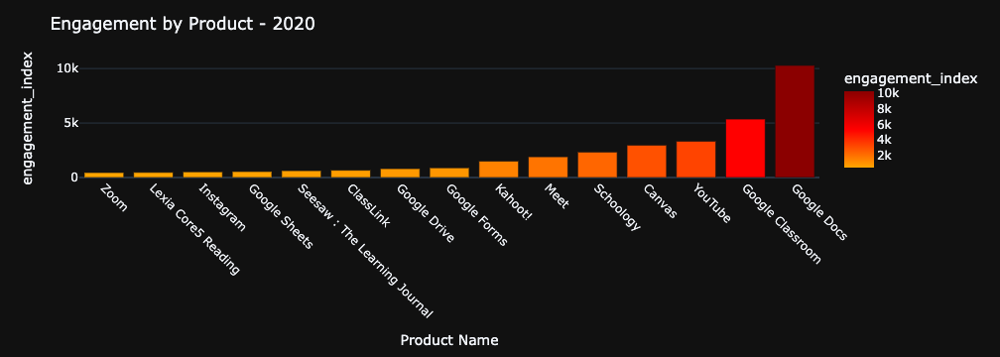

In [17]:
for_barchart1 = engagement_complete[['Product Name','engagement_index']]
grouped_for_barchart1 = for_barchart1.groupby(['Product Name'], as_index=False).mean() 

grouped_for_barchart1 = grouped_for_barchart1.dropna()
grouped_for_barchart1_sorted = grouped_for_barchart1.sort_values('engagement_index')[-15:]
fig = px.bar(grouped_for_barchart1_sorted, x='Product Name', y='engagement_index', color='engagement_index')
fig.update_layout(
    title={
        'text': "Engagement by Product - 2020"},template='plotly_dark',xaxis_tickangle=45
    )

fig.layout.coloraxis.colorscale = [(0.0, 'Orange'),(0.5,'Red'),(1.0,'darkred')]

fig.show()

In [18]:
for_treemap1 = engagement_complete[['Primary Essential Function','Provider/Company Name','Product Name','engagement_index']]
for_treemap1 = for_treemap1.dropna()

symbol = []
for funct in for_treemap1['Primary Essential Function']:
    f = funct.split(' - ')
    symbol.append(f[0])
for_treemap1['Symbol'] = symbol

grouped_for_treemap1 = for_treemap1.groupby(['Primary Essential Function','Provider/Company Name','Product Name', 'Symbol'], as_index=False).mean() 



In [19]:
grouped_for_treemap1.sort_values('engagement_index')[-15:]

,Primary Essential Function,Provider/Company Name,Product Name,Symbol,engagement_index
33,CM - Virtual Classroom - Video Conferencing & ...,"ZOOM VIDEO COMMUNICATIONS, INC.",Zoom,CM,454.551856
133,LC - Digital Learning Platforms,Lexia Learning,Lexia Core5 Reading,LC,469.961840
315,LC/CM/SDO - Other,Instagram,Instagram,LC/CM/SDO,521.411663
312,LC/CM/SDO - Other,Google LLC,Google Sheets,LC/CM/SDO,548.311132
61,LC - Content Creation & Curation,Seesaw Learning Inc,Seesaw : The Learning Journal,LC,628.701885
348,SDO - School Management Software - SSO,ClassLink,ClassLink,SDO,666.844419
311,LC/CM/SDO - Other,Google LLC,Google Drive,LC/CM/SDO,814.455172
0,CM - Classroom Engagement & Instruction - Asse...,Google LLC,Google Forms,CM,888.950223
282,LC - Study Tools,Kahoot! AS,Kahoot!,LC,1503.386972
29,CM - Virtual Classroom - Video Conferencing & ...,Google LLC,Meet,CM,1903.177151


CSScolor:
                aliceblue, antiquewhite, aqua, aquamarine, azure,
                beige, bisque, black, blanchedalmond, blue,
                blueviolet, brown, burlywood, cadetblue,
                chartreuse, chocolate, coral, cornflowerblue,
                cornsilk, crimson, cyan, darkblue, darkcyan,
                darkgoldenrod, darkgray, darkgrey, darkgreen,
                darkkhaki, darkmagenta, darkolivegreen, darkorange,
                darkorchid, darkred, darksalmon, darkseagreen,
                darkslateblue, darkslategray, darkslategrey,
                darkturquoise, darkviolet, deeppink, deepskyblue,
                dimgray, dimgrey, dodgerblue, firebrick,
                floralwhite, forestgreen, fuchsia, gainsboro,
                ghostwhite, gold, goldenrod, gray, grey, green,
                greenyellow, honeydew, hotpink, indianred, indigo,
                ivory, khaki, lavender, lavenderblush, lawngreen,
                lemonchiffon, lightblue, lightcoral, lightcyan,
                lightgoldenrodyellow, lightgray, lightgrey,
                lightgreen, lightpink, lightsalmon, lightseagreen,
                lightskyblue, lightslategray, lightslategrey,
                lightsteelblue, lightyellow, lime, limegreen,
                linen, magenta, maroon, mediumaquamarine,
                mediumblue, mediumorchid, mediumpurple,
                mediumseagreen, mediumslateblue, mediumspringgreen,
                mediumturquoise, mediumvioletred, midnightblue,
                mintcream, mistyrose, moccasin, navajowhite, navy,
                oldlace, olive, olivedrab, orange, orangered,
                orchid, palegoldenrod, palegreen, paleturquoise,
                palevioletred, papayawhip, peachpuff, peru, pink,
                plum, powderblue, purple, red, rosybrown,
                royalblue, saddlebrown, salmon, sandybrown,
                seagreen, seashell, sienna, silver, skyblue,
                slateblue, slategray, slategrey, snow, springgreen,
                steelblue, tan, teal, thistle, tomato, turquoise,
                violet, wheat, white, whitesmoke, yellow,
                yellowgreen

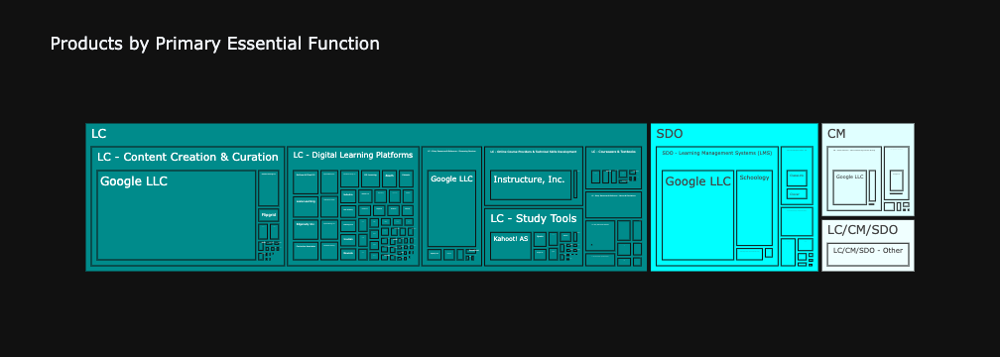

In [20]:
fig = px.treemap(grouped_for_treemap1, 
                path=['Symbol','Primary Essential Function','Provider/Company Name'], 
                values='engagement_index', 
                color='Symbol', 
                color_discrete_map={'LC':'darkcyan','SDO':'cyan','CM':'lightcyan','LC/CM/SDO':'azure'},title= "Products by Primary Essential Function",
                template='plotly_dark')

fig.show()

In [21]:
engagement_complete.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11691587 entries, 0 to 11691586
Data columns (total 13 columns):
 #   Column                      Dtype  
---  ------                      -----  
 0   time                        object 
 1   pct_access                  float64
 2   engagement_index            float64
 3   district_id                 int64  
 4   state                       object 
 5   locale                      object 
 6   pp_total_raw                float64
 7   LP ID                       int64  
 8   Product Name                object 
 9   Provider/Company Name       object 
 10  Primary Essential Function  object 
 11  pct_black_hispanic          float64
 12  pct_free_reduced            float64
dtypes: float64(5), int64(2), object(6)
memory usage: 1.2+ GB


In [22]:

for_chloropleth = engagement_complete[['engagement_index','pct_access','time','state']]
grouped_by_date_chloropleth = for_chloropleth[['time','pct_access','engagement_index','state']].groupby(['state'], as_index=False).sum()

In [23]:
us_state_abbrev = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'American Samoa': 'AS',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District Of Columbia': 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Guam': 'GU',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Northern Mariana Islands':'MP',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Puerto Rico': 'PR',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virgin Islands': 'VI',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

In [24]:
codes = []
for i in grouped_by_date_chloropleth['state']:
    codes.append(us_state_abbrev[i])

grouped_by_date_chloropleth['state_codes'] = codes

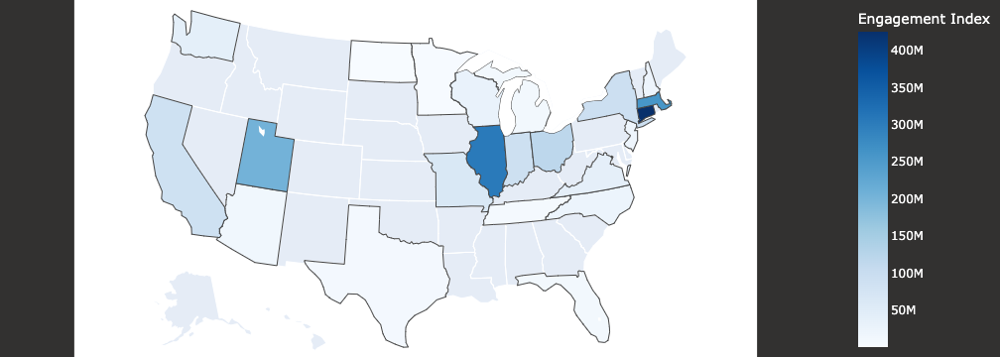

In [166]:
data2 = dict(
        type = 'choropleth',
        colorscale = 'blues',
        locations = codes,
        locationmode = 'USA-states',
        z = list(grouped_by_date_chloropleth['engagement_index']),
        colorbar = {'title':'Engagement Index'}
      )
  
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    geojson = json.load(response)
      
fig = px.choropleth(grouped_by_date_chloropleth, geojson=geojson, color='engagement_index',
                           color_continuous_scale="Viridis",
                           range_color=(0, 12),
                           scope="usa"
                   )
fig.update_layout(
        geo_scope='usa',
        plot_bgcolor="#323130",
        paper_bgcolor="#323130",
        margin=go.layout.Margin(l=0, r=35, t=0, b=0),
        font=dict(color="white"))

hexcode = 0
borders=[hexcode for x in range(len(df))]
fig.update_traces(marker_line_width=borders)

fig.add_trace(go.Choropleth(data2))

In [26]:
grouped_by_date_chloropleth.sort_values('engagement_index')[-3:]

,state,pct_access,engagement_index,state_codes
7,Massachusetts,961992.83,2.592307e+08,MA
5,Illinois,1191045.82,3.040042e+08,IL
2,Connecticut,1594691.52,4.253337e+08,CT


In [52]:

engagement_complete['state'].unique()

array([nan, 'Massachusetts', 'Utah', 'California', 'Indiana',
       'New Jersey', 'Connecticut', 'Illinois', 'Virginia', 'Ohio',
       'North Carolina', 'Michigan', 'New York', 'Washington',
       'District Of Columbia', 'North Dakota', 'Tennessee', 'Wisconsin',
       'Arizona', 'New Hampshire', 'Texas', 'Missouri', 'Florida',
       'Minnesota'], dtype=object)

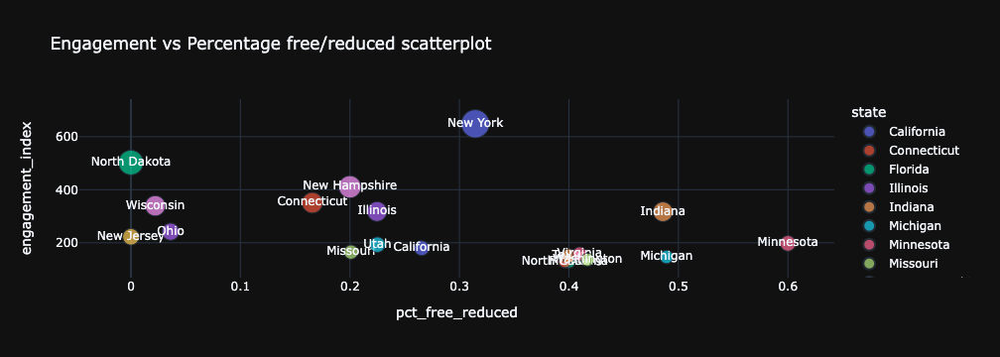

In [27]:
for_scatterplot = engagement_complete[['engagement_index','pct_free_reduced','state']]
for_scatterplot = for_scatterplot.dropna()
for_scatterplot_groupedby_state = for_scatterplot.groupby(['state'], as_index=False).mean()
fig = px.scatter(for_scatterplot_groupedby_state, 
            x="pct_free_reduced",
            y="engagement_index", 
            color="state",
            size='engagement_index',
            template="plotly_dark", 
            text='state',
            title= 'Engagement vs Percentage free/reduced scatterplot')
            
fig.show()

No relation temon between the two

In [28]:
engagement_complete.head(2)

,time,pct_access,engagement_index,district_id,state,locale,pp_total_raw,LP ID,Product Name,Provider/Company Name,Primary Essential Function,pct_black_hispanic,pct_free_reduced
0,2020-01-01,0.04,1.30,3188,NaN,NaN,NaN,29322,Khan Academy,Khan Academy,LC - Digital Learning Platforms,NaN,NaN
1,2020-01-02,0.26,17.78,3188,NaN,NaN,NaN,29322,Khan Academy,Khan Academy,LC - Digital Learning Platforms,NaN,NaN


In [30]:
engagement_complete_clean_prep = engagement_complete.copy()
engagement_complete_clean = engagement_complete_clean_prep.dropna(subset=['Primary Essential Function'])
engagement_complete_sorted = engagement_complete_clean.sort_values('time')
#to get mean engagement of all productucts, each day, on the basis of states.
grouped_by_date = engagement_complete_sorted[['time','engagement_index','Primary Essential Function','Provider/Company Name']].groupby(['time','Primary Essential Function','Provider/Company Name'], as_index=False).mean()
#to get sum of avg engagements on each day from every functional category there is.
grouped_by_date = grouped_by_date.groupby(['time','Primary Essential Function'], as_index=False).sum()
grouped_by_date['time'] = pd.to_datetime(grouped_by_date["time"])
grouped_by_date = grouped_by_date.set_index('time', drop=False)
#making 3 different dataframes for the 3 primary type of functionalities
grouped_by_date_LC = grouped_by_date[grouped_by_date['Primary Essential Function'].str.contains('LC')]
grouped_by_date_SDO = grouped_by_date[grouped_by_date['Primary Essential Function'].str.contains('SDO')]
grouped_by_date_CM = grouped_by_date[grouped_by_date['Primary Essential Function'].str.contains('CM')]


In [79]:
grouped_by_date_LC.groupby(pd.Grouper(freq="7D", origin="start_day")).sum()
#aita all the PEF er 1 week er sum diye dicche

,engagement_index
time,
2020-01-01,76572.909650
2020-01-08,137788.417947
2020-01-15,115186.741477
2020-01-22,139311.122605
2020-01-29,138861.628365
2020-02-05,138636.467936
2020-02-12,210988.760793
2020-02-19,254208.852397
2020-02-26,245182.837974


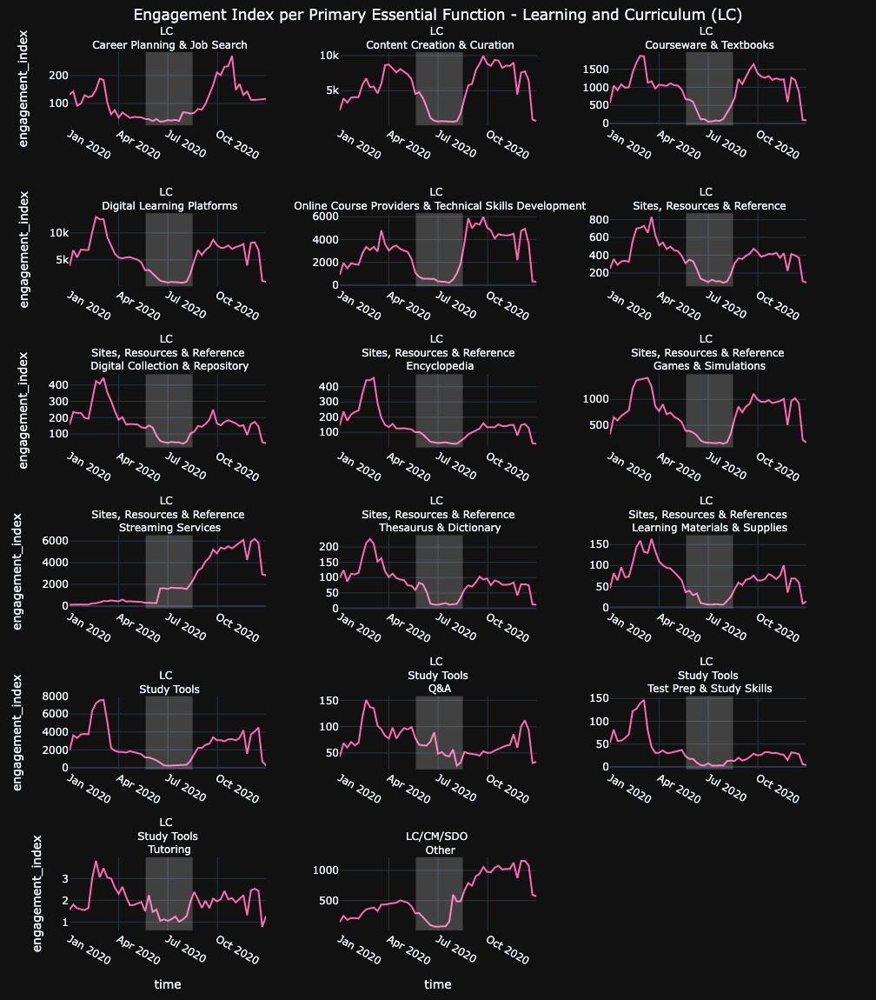

In [172]:
#the next part will have to extract grouped data of 17 PEFs across 53 weeks and make a list containing 901 rows (53*17)
cols = []
for x, y in grouped_by_date_LC.groupby(pd.Grouper(freq="7D", origin="start_day")):
    functions = []
    for function in y['Primary Essential Function']:
        if function not in functions:
            cols.append((y['time'][0], y[y['Primary Essential Function']==function]['engagement_index'].mean(), function))
            functions.append(function)
        else:
            break

dr_strage_time = pd.DataFrame(cols, columns=['time','engagement_index','Primary Essential Function'])

fig = px.line(dr_strage_time, x='time', y='engagement_index', facet_col="Primary Essential Function", 
              facet_col_wrap=3,color_discrete_map={'engagement_index':'cyan'},
             facet_row_spacing = 0.10, facet_col_spacing=0.10)

fig.update_layout(
    title={'text': "Engagement Index per Primary Essential Function - Learning and Curriculum (LC)",
    'y':.99, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, template='plotly_dark', height=1150)
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_xaxes(matches=None, showticklabels=True)

fig.add_vrect(x0='2020-05-21', x1='2020-08-16', fillcolor="white", opacity=0.2, line_width=0)
for i in range(len(fig.data)):
    fig.data[i].line.color = 'hotpink'
    fig.layout.annotations[i].text = '<br>'.join(fig.layout.annotations[i].text[27:].split('-')) 
    
fig.show()

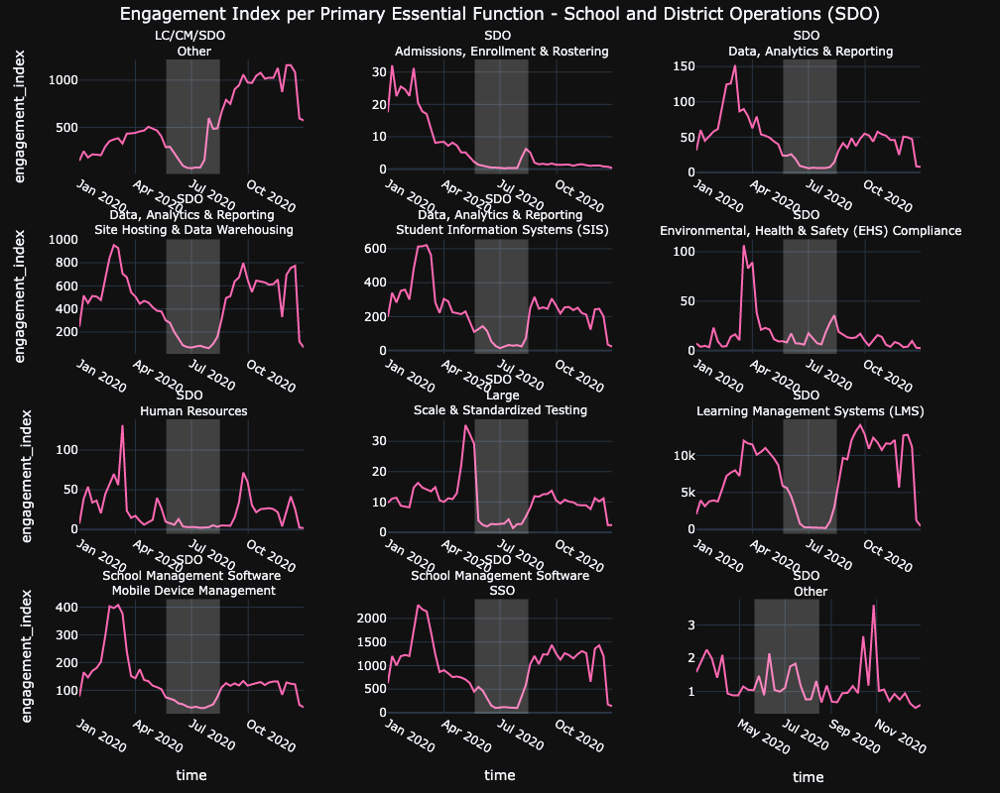

In [169]:
cols = []
for x, y in grouped_by_date_SDO.groupby(pd.Grouper(freq="7D", origin="start_day")):
    functions = []
    for function in y['Primary Essential Function']:
        if function not in functions:
            cols.append((y['time'][0], y[y['Primary Essential Function']==function]['engagement_index'].mean(), function))
            functions.append(function)
        else:
            break

dr_strage_time = pd.DataFrame(cols, columns=['time','engagement_index','Primary Essential Function'])

fig = px.line(dr_strage_time, x='time', y='engagement_index', facet_col="Primary Essential Function", 
              facet_col_wrap=3,color_discrete_map={'engagement_index':'cyan'},
             facet_row_spacing = 0.10, facet_col_spacing=0.10)

fig.update_layout(
    title={'text': "Engagement Index per Primary Essential Function - School and District Operations (SDO)",
    'y':.99, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, template='plotly_dark', height=800)
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_xaxes(matches=None, showticklabels=True)

fig.add_vrect(x0='2020-05-21', x1='2020-08-16', fillcolor="white", opacity=0.2, line_width=0)
for i in range(len(fig.data)):
    fig.data[i].line.color = 'hotpink'
    fig.layout.annotations[i].text = '<br>'.join(fig.layout.annotations[i].text[27:].split('-')) 

fig.show()

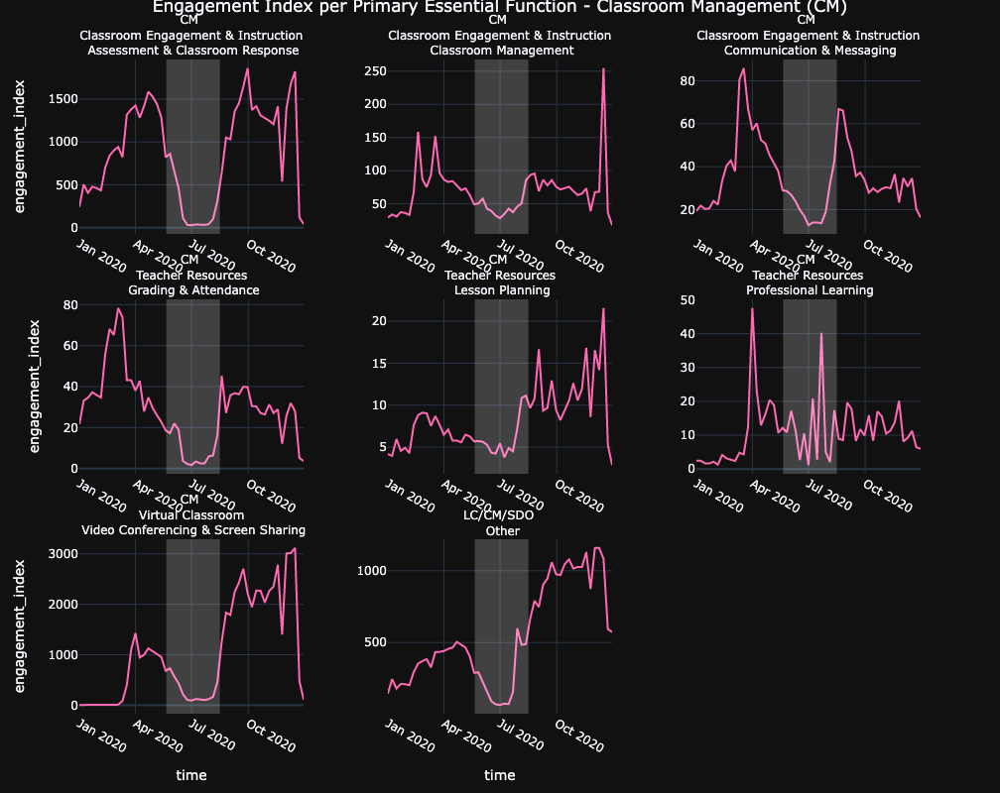

In [168]:
cols = []
for x, y in grouped_by_date_CM.groupby(pd.Grouper(freq="7D", origin="start_day")):
    functions = []
    for function in y['Primary Essential Function']:
        if function not in functions:
            cols.append((y['time'][0], y[y['Primary Essential Function']==function]['engagement_index'].mean(), function))
            functions.append(function)
        else:
            break

dr_strage_time = pd.DataFrame(cols, columns=['time','engagement_index','Primary Essential Function'])

fig = px.line(dr_strage_time, x='time', y='engagement_index', facet_col="Primary Essential Function", 
              facet_col_wrap=3,color_discrete_map={'engagement_index':'cyan'},
             facet_row_spacing = 0.10, facet_col_spacing=0.10)

fig.update_layout(
    title={'text': "Engagement Index per Primary Essential Function - Classroom Management (CM)",
    'y':1, 'x':0.5,'xanchor': 'center', 'yanchor': 'top'}, template='plotly_dark', height=800)
fig.update_yaxes(matches=None, showticklabels=True)
fig.update_xaxes(matches=None, showticklabels=True)

fig.add_vrect(x0='2020-05-21', x1='2020-08-16', fillcolor="white", opacity=0.2, line_width=0)

for i in range(len(fig.data)):
    fig.data[i].line.color = 'hotpink'
    fig.layout.annotations[i].text = '<br>'.join(fig.layout.annotations[i].text[27:].split('-')) 

fig.show()

In [200]:
grouped_by_date = engagement_complete[['time','pct_access','engagement_index','locale']].groupby(['time','locale'], as_index=False).mean()
#grouped_by_date_lowexp = engagement_complete[['time','pct_access','engagement_index','pp_total_raw']][engagement_complete['pp_total_raw']<=17000].groupby('time', as_index=False).mean()
#grouped_by_date_highexp = engagement_complete[['time','pct_access','engagement_index','pp_total_raw']][engagement_complete['pp_total_raw']>=18000].groupby('time', as_index=False).mean()

grouped_by_date_sorted = grouped_by_date.sort_values('time')
grouped_by_date_sorted2 = grouped_by_date_sorted[['time','engagement_index','locale']].groupby(['time','locale'], as_index=False).mean()
grouped_by_date_sorted2['time'] = pd.to_datetime(grouped_by_date_sorted2["time"])
grouped_by_date_sorted2 = grouped_by_date_sorted2.set_index('time', drop=False)

In [194]:
grouped_by_date_sorted2

,time,locale,engagement_index
time,,,
2020-01-01,2020-01-01,City,6.265015
2020-01-01,2020-01-01,Rural,33.440543
2020-01-01,2020-01-01,Suburb,22.511022
2020-01-01,2020-01-01,Town,15.936756
2020-01-02,2020-01-02,City,40.694297
...,...,...,...
2020-12-30,2020-12-30,Town,60.036701
2020-12-31,2020-12-31,City,53.863697
2020-12-31,2020-12-31,Rural,82.102976


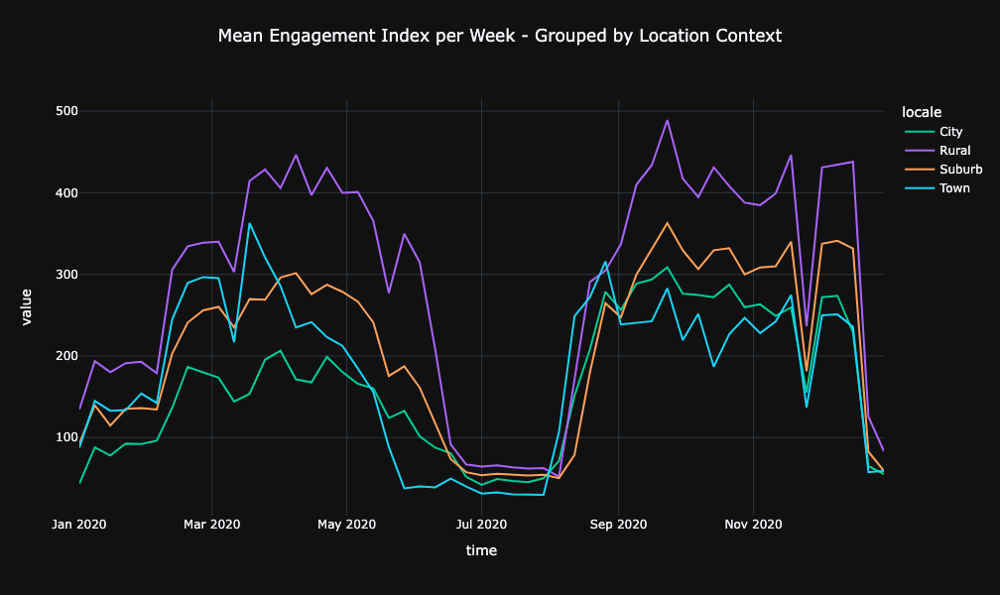

In [216]:
cols = []
for x, y in grouped_by_date_sorted2.groupby(pd.Grouper(freq="7D", origin="start_day")):
    locale = []
    for loc in y['locale']:
        if loc not in locale:
            cols.append((y['time'][0], y[y['locale']==loc]['engagement_index'].mean(), loc))
            locale.append(loc)
        else:
            break
        
dr_strage_time_2 = pd.DataFrame(cols, columns=['time','engagement_index','locale'])

fig = px.line(dr_strage_time_2, x='time', y=['engagement_index'], color='locale', height=400, width=1000,
        title='Engagement Index - High Per-Pupil Total Expenditure vs Low Per-Pupil Total Expenditure',
        color_discrete_map={"engagement_lowexp": "Red", "engagement_highexp": "MediumPurple"},
        template="plotly_dark"
        )

fig.update_layout(
    title={
        'text': "Mean Engagement Index per Week - Grouped by Location Context",
        'y':0.95,'x':0.5,'xanchor': 'center', 'yanchor': 'top'},    
    template='plotly_dark',
    height=600
    )

fig.show()